# Notebook to run basic analysis on Raw data before cellbender

**Created by :** Srivalli Kolla

**Created on :** 12 August, 2024

**Modified on :** 6 September, 2024

**Institute of SystemsImmunology, University of Würuburg**

Env : scanpy(Python 3.12.4)

# Importing packages

In [1]:
import anndata as ad
import scanpy as sc
import os
import datetime
import bbknn
import random
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import median_abs_deviation

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 300, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'svg')

timestamp = datetime.datetime.now().strftime("%d_%m_%y")

-----
anndata     0.10.8
scanpy      1.10.2
-----
PIL                 10.3.0
annoy               NA
asttokens           NA
attr                23.2.0
bbknn               1.6.0
cffi                1.16.0
colorama            0.4.6
comm                0.2.2
cycler              0.12.1
cython_runtime      NA
dateutil            2.9.0.post0
debugpy             1.8.2
decorator           5.1.1
defusedxml          0.7.1
distutils           3.12.4
django              5.0.6
executing           2.0.1
h5py                3.11.0
igraph              0.11.5
ipykernel           6.29.5
ipython_genutils    0.2.0
ipywidgets          8.1.3
jedi                0.19.1
joblib              1.4.2
kiwisolver          1.4.5
legacy_api_wrap     NA
leidenalg           0.10.2
llvmlite            0.43.0
louvain             0.8.2
matplotlib          3.8.4
mpl_toolkits        NA
natsort             8.4.0
numba               0.60.0
numexpr             2.10.1
numpy               1.26.4
packaging           24.1
pandas    

# Data loading and Preprocessing

In [3]:
files = [
    ("A9_2.h5ad"),
    ("A10_2.h5ad"),
    ("A11_2.h5ad"),
    ("A12_2.h5ad"),
    ("B1_2.h5ad"),
    ("B2_2.h5ad")
]

genotype_mapping = {
    "A9_2": "WT",
    "A10_2": "WT",
    "A11_2": "Mdx",
    "A12_2": "Mdx",
    "B1_2": "MdxSCID",
    "B2_2": "MdxSCID"
}

base_dir = '../../raw_data/raw_anndatas/'
before_cb_raw_samples_list = []

for filename in files:
    file_path = os.path.join(base_dir, filename)
    before_cb_raw_samples = sc.read(file_path)

    sample_name = os.path.splitext(filename)[0]
    before_cb_raw_samples.obs['sample'] = sample_name

    genotype = genotype_mapping[sample_name]
    before_cb_raw_samples.obs['genotype'] = genotype

    before_cb_raw_samples_list.append(before_cb_raw_samples)

before_cb_raw = ad.concat(before_cb_raw_samples_list, join='inner', keys=files)
before_cb_raw

/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 10055673 × 32285
    obs: 'sample', 'genotype'

In [4]:
before_cb_raw

AnnData object with n_obs × n_vars = 10055673 × 32285
    obs: 'sample', 'genotype'

In [5]:
before_cb_raw.write_h5ad(f'../../raw_data/raw_anndatas/dmd_merged_raw_before_cb_{timestamp}.h5ad')

In [6]:
before_cb_raw = sc.read_h5ad(f'../../raw_data/raw_anndatas/dmd_merged_raw_before_cb_{timestamp}.h5ad')
before_cb_raw

/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 10055673 × 32285
    obs: 'sample', 'genotype'

In [7]:
ref = sc.read_h5ad('../../data/annotated_dmd_ref_filtered_dmd_31_08_24.h5ad')
ref

AnnData object with n_obs × n_vars = 117208 × 7000
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'cell_type-broad'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'cell_type-broad_colors', 'hvg', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_scANVI', 'X_scVI', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

## Quality check

In [8]:
before_cb_raw.var["mt"] = before_cb_raw.var_names.str.startswith("mt-")

before_cb_raw.var["ribo"] = before_cb_raw.var_names.str.startswith(("rps", "rpl"))

In [9]:
sc.pp.calculate_qc_metrics(
    before_cb_raw, qc_vars=["mt", "ribo"], inplace=True, percent_top=[20],log1p=True)
before_cb_raw

AnnData object with n_obs × n_vars = 10055673 × 32285
    obs: 'sample', 'genotype', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [10]:
def is_outlier(after_cb, metric: str, nmads: int):
    M = after_cb.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [11]:
before_cb_raw.obs["outlier"] = (
    is_outlier(before_cb_raw, "log1p_total_counts", 5)
    | is_outlier(before_cb_raw, "log1p_n_genes_by_counts", 5)
    | is_outlier(before_cb_raw, "pct_counts_in_top_20_genes", 5)
)
before_cb_raw.obs.outlier.value_counts()

outlier
False    9672309
True      383364
Name: count, dtype: int64

## Soup data details

In [12]:
ambiguous_cells = before_cb_raw[before_cb_raw.obs.outlier].copy()


print(f"Number of ambiguous cells: {ambiguous_cells.n_obs}")

ambiguous_cells_data = ambiguous_cells.X
if hasattr(ambiguous_cells_data, 'toarray'):
    ambiguous_cells_data = ambiguous_cells_data.toarray()
genes_expressed_in_ambiguous_cells = (ambiguous_cells_data > 0).sum(axis=0) > 0

expressed_genes_names = ambiguous_cells.var_names[genes_expressed_in_ambiguous_cells]

print("Genes expressed in ambiguous cells:")
print(expressed_genes_names)

gene_expression_summary = pd.DataFrame(
    {'Gene': ambiguous_cells.var_names, 
     'Total Expression in Ambiguous Cells': ambiguous_cells_data.sum(axis=0)}
)

gene_expression_summary = gene_expression_summary.sort_values(by='Total Expression in Ambiguous Cells', ascending=False)

print("Summary of gene expression in ambiguous cells:")
print(gene_expression_summary)

/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Number of ambiguous cells: 383364
Genes expressed in ambiguous cells:
Index(['Xkr4', 'Gm1992', 'Gm19938', 'Gm37381', 'Rp1', 'Sox17', 'Gm37587',
       'Gm37323', 'Mrpl15', 'Lypla1',
       ...
       'Spry3', 'Tmlhe', 'Vmn2r122', 'CR974586.4', '4933409K07Rik', 'Gm10931',
       'CT868723.1', 'CAAA01147332.1', 'AC163611.1', 'AC149090.1'],
      dtype='object', length=28595)
Summary of gene expression in ambiguous cells:
             Gene  Total Expression in Ambiguous Cells
28049     Gm42418                           17008760.0
29543      Malat1                           16106058.0
32197      mt-Co1                           12402554.0
32201      mt-Co3                            8771068.0
32198      mt-Co2                            6383967.0
...           ...                                  ...
32250  CR974586.3                                  0.0
32251  CR974586.5                                  0.0
32254  CR974586.1                                  0.0
32255    Ccl27a-2          

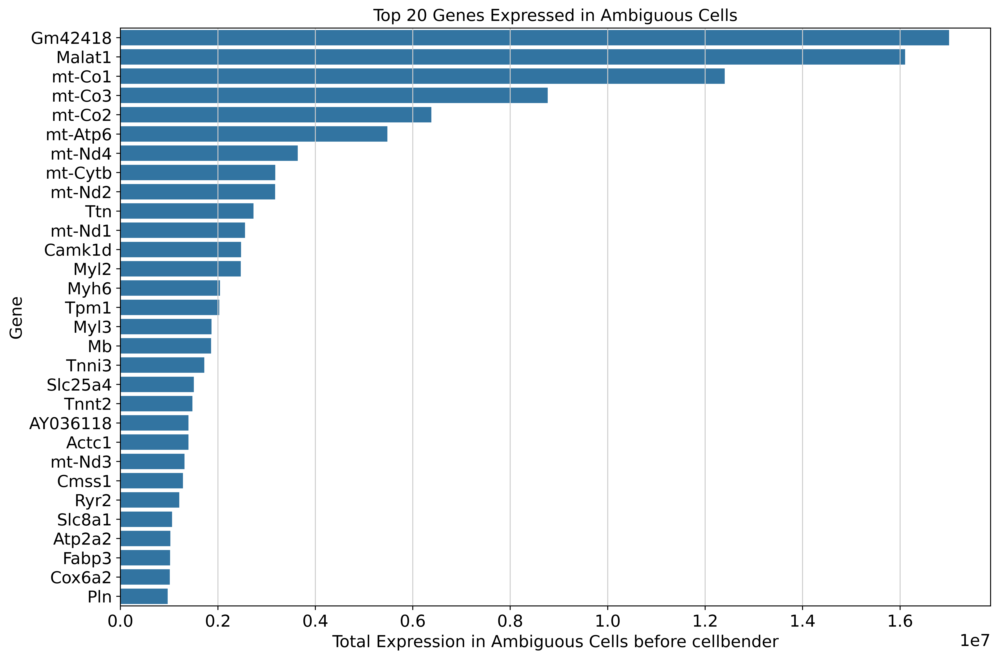

In [13]:
plt.figure(figsize=(12, 8))  
sns.barplot(x='Total Expression in Ambiguous Cells', y='Gene', data=gene_expression_summary.head(30))  
plt.xlabel('Total Expression in Ambiguous Cells before cellbender')
plt.ylabel('Gene')
plt.title('Top 20 Genes Expressed in Ambiguous Cells')
plt.tight_layout()
plt.show()

In [14]:
expressed_genes_df = pd.DataFrame(expressed_genes_names, columns=['Gene'])
file_path = '../../raw_data/raw_anndatas/ambiguous_genes.txt'

expressed_genes_df.to_csv(file_path, index=False, header=False, sep='\t')

In [15]:
print(f"Total number of cells: {before_cb_raw.n_obs}")
before_cb_raw = before_cb_raw[(~before_cb_raw.obs.outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {before_cb_raw.n_obs}")

Total number of cells: 10055673


Number of cells after filtering of low quality cells: 9672309


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [16]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

is_raw = X_is_raw(before_cb_raw)
print(is_raw)

True


### HVG

In [17]:
sc.pp.highly_variable_genes(before_cb_raw,flavor = "seurat_v3", batch_key= 'sample', n_top_genes= 8000, subset= True)

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [18]:
before_cb_raw.obs_names_make_unique()
before_cb_raw

AnnData object with n_obs × n_vars = 9672309 × 8000
    obs: 'sample', 'genotype', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg'

/tmp/ipykernel_77291/452785339.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Gene', y='Mean Expression', data=gene_mean_expression_df, palette='viridis')


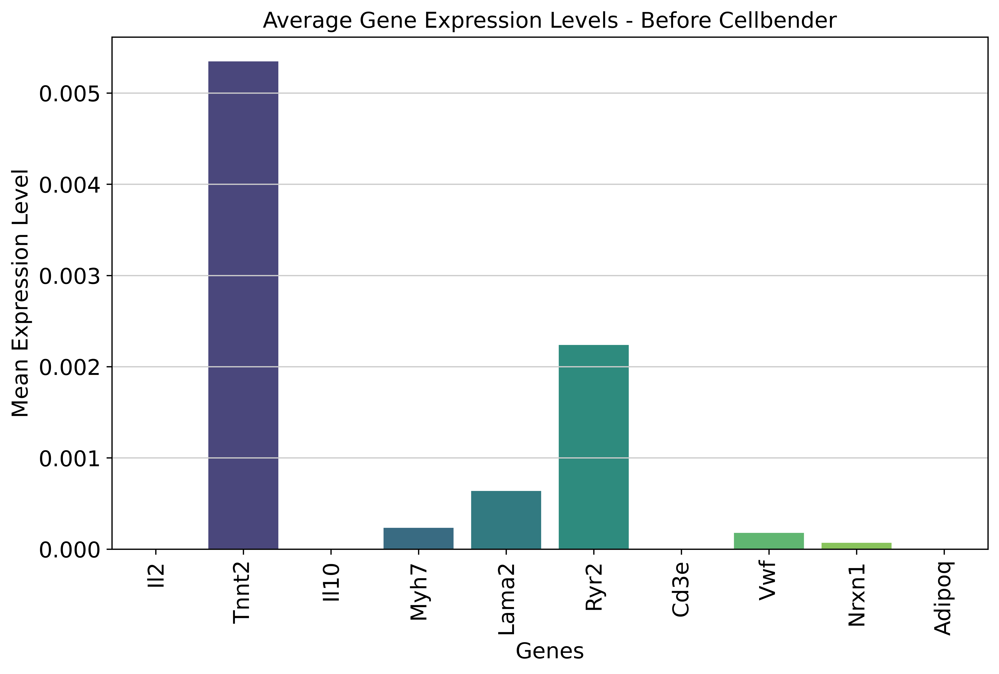

In [19]:
genes_of_interest = ['Il2','Tnnt2','Il10', 'Ttn','Dcn','Myh7', 'Dmd','Ctnna3','Lama2','Ryr2','Cd19','Cd3e','Cd44', 'Vwf', 'Myh11', 'Rgs4', 'Kcnj8', 'C1qa', 'Nrxn1', 'Adipoq', 'Trem2']
present_genes = [gene for gene in genes_of_interest if gene in before_cb_raw.var.index]

gene_expression_data = before_cb_raw[:, present_genes].X
gene_expression_df = pd.DataFrame(gene_expression_data.toarray(), columns=present_genes)

gene_mean_expression = gene_expression_df.mean(axis=0)
gene_mean_expression_df = pd.DataFrame({'Gene': gene_mean_expression.index, 'Mean Expression': gene_mean_expression.values})

plt.figure(figsize=(10, 6))
sns.barplot(x='Gene', y='Mean Expression', data=gene_mean_expression_df, palette='viridis')
plt.xticks(rotation=90)
plt.title('Average Gene Expression Levels - Before Cellbender')
plt.xlabel('Genes')
plt.ylabel('Mean Expression Level')
plt.show()

### Normalization

In [20]:
sc.pp.normalize_total(before_cb_raw, target_sum= 1e6)
sc.pp.log1p(before_cb_raw)
before_cb_raw.layers["normalized"] = before_cb_raw.X.copy()

normalizing counts per cell
    finished (0:00:00)


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


In [21]:
sc.pp.filter_cells(before_cb_raw, min_counts=1)
sc.pp.filter_cells(before_cb_raw, min_genes= 3)

filtered out 5459208 cells that have less than 1 counts


filtered out 3941194 cells that have less than 3 genes expressed


In [22]:
before_cb_raw

AnnData object with n_obs × n_vars = 271907 × 8000
    obs: 'sample', 'genotype', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'n_counts', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg', 'log1p'
    layers: 'normalized'

### Batch correction

In [23]:
sc.pp.pca(before_cb_raw, n_comps = 50, use_highly_variable = True, svd_solver = 'arpack', random_state = 1712)
sc.pp.neighbors(before_cb_raw, use_rep = "X_pca", n_neighbors = 50, metric = 'minkowski', random_state = 1786)
bbknn_raw_before_cb_raw = bbknn.bbknn(before_cb_raw, neighbors_within_batch = 4, batch_key = 'sample', approx = True, copy = True)

computing PCA
    with n_comps=50


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_pca.py:385: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:01)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:02)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:31)


### Label Transfer - Barcode mapping

In [24]:
ref.obs.index

Index(['ACACTGATCATTATCC-1-A9_2', 'TCTTCCTGTCATAACC-1-A9_2',
       'ATCTCTAGTTTCAGAC-1-A9_2', 'TGAATGCAGCTCCATA-1-A9_2',
       'GCAGCTGCACAAGTGG-1-A9_2', 'GAGACTTCAGTTAGAA-1-A9_2',
       'CCGATCTTCGCACGGT-1-A9_2', 'TAACTTCTCACAGAGG-1-A9_2',
       'CAACGATGTCTACGTA-1-A9_2', 'ATCGATGGTACCTAGT-1-A9_2',
       ...
       'TGACCCTAGCACCTGC-1-A12_2', 'CCGGACAGTAGCGCTC-1-A12_2',
       'ATTCGTTTCACGTCCT-1-A12_2', 'GTCTCACAGTGTTCAC-1-A12_2',
       'CATAAGCAGTGTCATC-1-A12_2', 'GGTGATTCACCATATG-1-A12_2',
       'TGGTAGTTCATTCGTT-1-A12_2', 'CAACCTCGTGCATTAC-1-A12_2',
       'GTGTGGCAGAAATCCA-1-A12_2', 'CACTGGGTCAACGAGG-1-A12_2'],
      dtype='object', length=117208)

In [25]:
bbknn_raw_before_cb_raw.obs.index

Index(['AAACCCAAGAAACCCA-1', 'AAACCCAAGAGCTGCA-1', 'AAACCCAAGCCAGACA-1',
       'AAACCCAAGCGATGGT-1', 'AAACCCAAGCTTCGTA-1', 'AAACCCAAGGCTCTCG-1',
       'AAACCCAAGTCGTTAC-1', 'AAACCCAAGTGCAGCG-1', 'AAACCCAAGTGGATAT-1',
       'AAACCCACAAAGGCGT-1',
       ...
       'TTTGTTGTCCATAGAC-1-4', 'TTTGTTGTCCGAAATC-1-1', 'TTTGTTGTCCGTCACT-1-1',
       'TTTGTTGTCCTAAACG-1-1', 'TTTGTTGTCCTCTAGC-1-1', 'TTTGTTGTCGCCTATC-1-1',
       'TTTGTTGTCGCGCCAA-1-2', 'TTTGTTGTCGTTCTAT-1-2', 'TTTGTTGTCTCTCGAC-1-2',
       'TTTGTTGTCTTAGCAG-1-3'],
      dtype='object', length=271907)

In [26]:
ref_barcodes = pd.DataFrame(ref.obs.index, columns= ['barcodes'])
ref_barcodes

,barcodes
0,ACACTGATCATTATCC-1-A9_2
1,TCTTCCTGTCATAACC-1-A9_2
2,ATCTCTAGTTTCAGAC-1-A9_2
3,TGAATGCAGCTCCATA-1-A9_2
4,GCAGCTGCACAAGTGG-1-A9_2
...,...
117203,GGTGATTCACCATATG-1-A12_2
117204,TGGTAGTTCATTCGTT-1-A12_2
117205,CAACCTCGTGCATTAC-1-A12_2
117206,GTGTGGCAGAAATCCA-1-A12_2


In [27]:
def remove_after_last_hyphen(barcode):
    return barcode.rsplit('-', 1)[0] 

def remove_up_to_second_underscore(barcode):
    parts = barcode.split('_')  
    if len(parts) > 2: 
        cleaned = '_'.join(parts[2:])
        return cleaned.rsplit('-', 1)[0] 
    return barcode 


In [28]:
ref_barcodes['cleaned_barcodes'] = ref_barcodes['barcodes'].apply(remove_after_last_hyphen)
ref_barcodes['cell_type-broad'] = ref.obs['cell_type-broad'].values
ref_barcodes

,barcodes,cleaned_barcodes,cell_type-broad
0,ACACTGATCATTATCC-1-A9_2,ACACTGATCATTATCC-1,cardiomyocytes
1,TCTTCCTGTCATAACC-1-A9_2,TCTTCCTGTCATAACC-1,cardiomyocytes
2,ATCTCTAGTTTCAGAC-1-A9_2,ATCTCTAGTTTCAGAC-1,cardiomyocytes
3,TGAATGCAGCTCCATA-1-A9_2,TGAATGCAGCTCCATA-1,cardiomyocytes
4,GCAGCTGCACAAGTGG-1-A9_2,GCAGCTGCACAAGTGG-1,cardiomyocytes
...,...,...,...
117203,GGTGATTCACCATATG-1-A12_2,GGTGATTCACCATATG-1,myeloid
117204,TGGTAGTTCATTCGTT-1-A12_2,TGGTAGTTCATTCGTT-1,myeloid
117205,CAACCTCGTGCATTAC-1-A12_2,CAACCTCGTGCATTAC-1,myeloid
117206,GTGTGGCAGAAATCCA-1-A12_2,GTGTGGCAGAAATCCA-1,myeloid


In [29]:
if len(ref_barcodes['cleaned_barcodes']) == ref.obs.shape[0]:

    ref.obs.index = ref_barcodes['cleaned_barcodes'].values
else:
    print(f"Length mismatch: {len(ref_barcodes['cleaned_barcodes'])} vs {ref.obs.shape[0]}")

print(ref.obs.index)

Index(['ACACTGATCATTATCC-1', 'TCTTCCTGTCATAACC-1', 'ATCTCTAGTTTCAGAC-1',
       'TGAATGCAGCTCCATA-1', 'GCAGCTGCACAAGTGG-1', 'GAGACTTCAGTTAGAA-1',
       'CCGATCTTCGCACGGT-1', 'TAACTTCTCACAGAGG-1', 'CAACGATGTCTACGTA-1',
       'ATCGATGGTACCTAGT-1',
       ...
       'TGACCCTAGCACCTGC-1', 'CCGGACAGTAGCGCTC-1', 'ATTCGTTTCACGTCCT-1',
       'GTCTCACAGTGTTCAC-1', 'CATAAGCAGTGTCATC-1', 'GGTGATTCACCATATG-1',
       'TGGTAGTTCATTCGTT-1', 'CAACCTCGTGCATTAC-1', 'GTGTGGCAGAAATCCA-1',
       'CACTGGGTCAACGAGG-1'],
      dtype='object', length=117208)


In [30]:
bbknn_raw_before_cb_raw_barcodes = pd.DataFrame(bbknn_raw_before_cb_raw.obs.index, columns= ['barcodes'])
bbknn_raw_before_cb_raw_barcodes

,barcodes
0,AAACCCAAGAAACCCA-1
1,AAACCCAAGAGCTGCA-1
2,AAACCCAAGCCAGACA-1
3,AAACCCAAGCGATGGT-1
4,AAACCCAAGCTTCGTA-1
...,...
271902,TTTGTTGTCGCCTATC-1-1
271903,TTTGTTGTCGCGCCAA-1-2
271904,TTTGTTGTCGTTCTAT-1-2
271905,TTTGTTGTCTCTCGAC-1-2


In [31]:
bbknn_raw_before_cb_raw_barcodes['cleaned_barcodes'] = bbknn_raw_before_cb_raw_barcodes['barcodes'].apply(remove_up_to_second_underscore)
bbknn_raw_before_cb_raw_barcodes

,barcodes,cleaned_barcodes
0,AAACCCAAGAAACCCA-1,AAACCCAAGAAACCCA-1
1,AAACCCAAGAGCTGCA-1,AAACCCAAGAGCTGCA-1
2,AAACCCAAGCCAGACA-1,AAACCCAAGCCAGACA-1
3,AAACCCAAGCGATGGT-1,AAACCCAAGCGATGGT-1
4,AAACCCAAGCTTCGTA-1,AAACCCAAGCTTCGTA-1
...,...,...
271902,TTTGTTGTCGCCTATC-1-1,TTTGTTGTCGCCTATC-1-1
271903,TTTGTTGTCGCGCCAA-1-2,TTTGTTGTCGCGCCAA-1-2
271904,TTTGTTGTCGTTCTAT-1-2,TTTGTTGTCGTTCTAT-1-2
271905,TTTGTTGTCTCTCGAC-1-2,TTTGTTGTCTCTCGAC-1-2


In [32]:
mapping_dict = pd.Series(ref_barcodes['cell_type-broad'].values, index=ref_barcodes['cleaned_barcodes']).to_dict()
mapping_dict

{'ACACTGATCATTATCC-1': 'cardiomyocytes',
 'TCTTCCTGTCATAACC-1': 'cardiomyocytes',
 'ATCTCTAGTTTCAGAC-1': 'cardiomyocytes',
 'TGAATGCAGCTCCATA-1': 'cardiomyocytes',
 'GCAGCTGCACAAGTGG-1': 'cardiomyocytes',
 'GAGACTTCAGTTAGAA-1': 'cardiomyocytes',
 'CCGATCTTCGCACGGT-1': 'cardiomyocytes',
 'TAACTTCTCACAGAGG-1': 'cardiomyocytes',
 'CAACGATGTCTACGTA-1': 'cardiomyocytes',
 'ATCGATGGTACCTAGT-1': 'cardiomyocytes',
 'TTTGGTTCATCAACCA-1': 'cardiomyocytes',
 'AATCGTGAGAATTTGG-1': 'cardiomyocytes',
 'CTTCCGAGTCCCAAAT-1': 'cardiomyocytes',
 'AATTCCTTCACCGACG-1': 'cardiomyocytes',
 'TAGAGTCCACACCTTC-1': 'cardiomyocytes',
 'ATTCACTTCCTCACTG-1': 'cardiomyocytes',
 'GTTCCGTTCCCTCGTA-1': 'cardiomyocytes',
 'GACGTTAAGGAAAGGT-1': 'cardiomyocytes',
 'TCACATTCATTCACCC-1': 'cardiomyocytes',
 'CATTGCCCACGACGCT-1': 'cardiomyocytes',
 'GATCACATCGCTTAAG-1': 'lymphoid',
 'AACCTGAGTCACTCAA-1': 'cardiomyocytes',
 'CTACTATGTAGCGATG-1': 'cardiomyocytes',
 'CACAACATCGTTCTAT-1': 'cardiomyocytes',
 'GTGAGCCAGACGTCCC-1':

In [33]:
bbknn_raw_before_cb_raw_barcodes['cell_type-broad'] = bbknn_raw_before_cb_raw_barcodes['cleaned_barcodes'].map(mapping_dict).fillna('Unmatched')
bbknn_raw_before_cb_raw_barcodes['cell_type-broad'].value_counts()

cell_type-broad
Unmatched          269303
lymphoid             1467
vascular states       532
fibroblasts           227
cardiomyocytes        190
myeloid               188
Name: count, dtype: int64

In [34]:
bbknn_raw_before_cb_raw.obs['cell_type-broad'] = bbknn_raw_before_cb_raw_barcodes['cell_type-broad'].values

In [35]:
bbknn_raw_before_cb_raw.obs['cell_type-broad'].value_counts()

cell_type-broad
Unmatched          269303
lymphoid             1467
vascular states       532
fibroblasts           227
cardiomyocytes        190
myeloid               188
Name: count, dtype: int64

In [36]:
bbknn_raw_before_cb_raw

AnnData object with n_obs × n_vars = 271907 × 8000
    obs: 'sample', 'genotype', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'n_counts', 'n_genes', 'cell_type-broad'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg', 'log1p', 'pca', 'neighbors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'normalized'
    obsp: 'distances', 'connectivities'

## Data visualization

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:40:57)


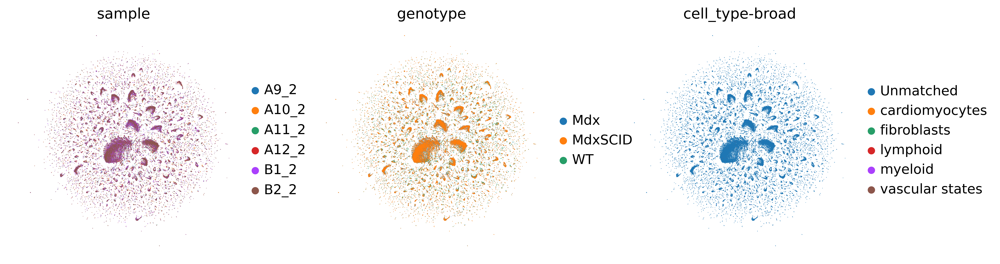

In [37]:
sc.tl.umap(bbknn_raw_before_cb_raw, min_dist = 0.4, spread = 3, random_state = 1789)
sc.pl.umap(bbknn_raw_before_cb_raw, color = ['sample', 'genotype','cell_type-broad'], frameon =False)

In [38]:
genes_of_interest = ['Il2','Tnnt2','Il10', 'Ttn','Dcn','Myh7', 'Dmd','Ctnna3','Lama2','Ryr2','Cd19','Cd3e','Cd44', 'Vwf', 'Myh11', 'Rgs4', 'Kcnj8', 'C1qa', 'Nrxn1', 'Adipoq', 'Trem2']
present_genes = [gene for gene in genes_of_interest if gene in bbknn_raw_before_cb_raw.var.index]

In [39]:
sc.pl.umap(bbknn_raw_before_cb_raw, color = present_genes, frameon =False)

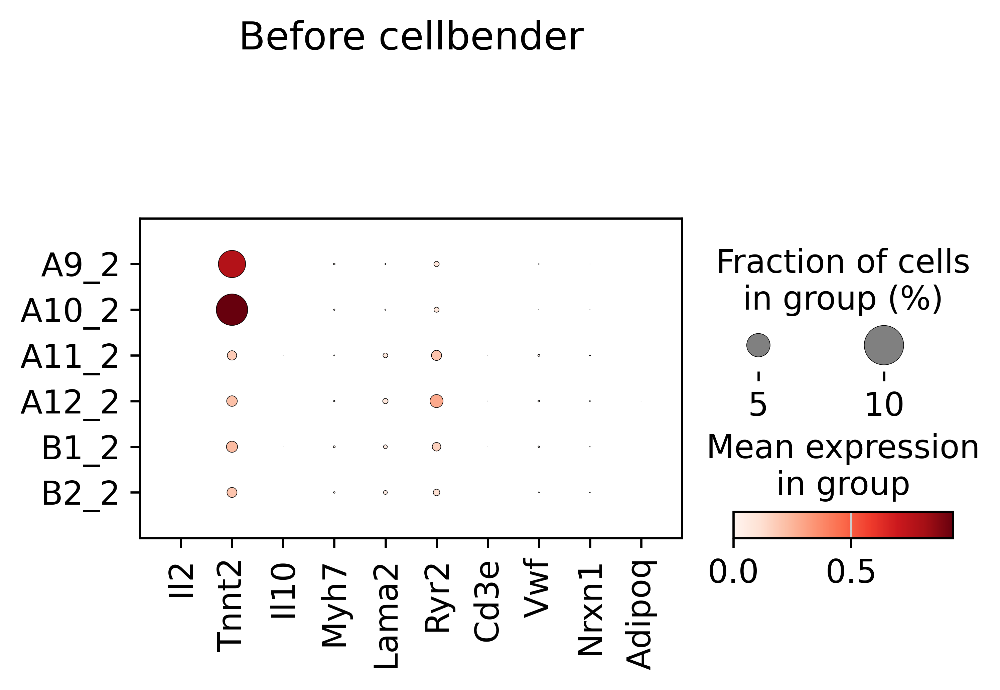

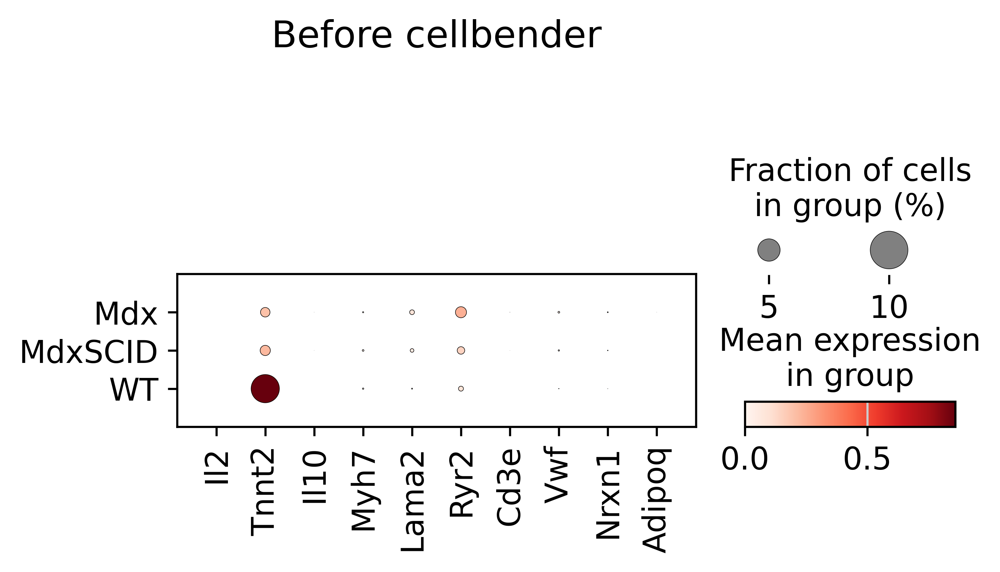

In [40]:
sc.pl.dotplot(bbknn_raw_before_cb_raw, var_names= present_genes, groupby= 'sample', title = 'Before cellbender')
sc.pl.dotplot(bbknn_raw_before_cb_raw, var_names= present_genes, groupby= 'genotype', title = 'Before cellbender')

In [41]:
sc.pl.dotplot(bbknn_raw_before_cb_raw, var_names= ['Ttn', 'Ryr2','Fhl2', 'Ctnna3', 'Slc8a1', 'Sorbs2', 'Fgf12', 'Mybpc3', 'Myom1', 'Ablim1', 'Sorbs1', 'Dmd', 'Cacna1c', 'Pde3a', 'Prkg1', 'Lama2', 'Dcn', 'Gsn'], groupby= 'cell_type-broad', cmap= 'RdYlBu_r', title= ' Before Cellbender')

KeyError: "Could not find keys '['Ctnna3', 'Dcn', 'Dmd', 'Fgf12', 'Gsn', 'Ttn']' in columns of `adata.obs` or in adata.var_names."

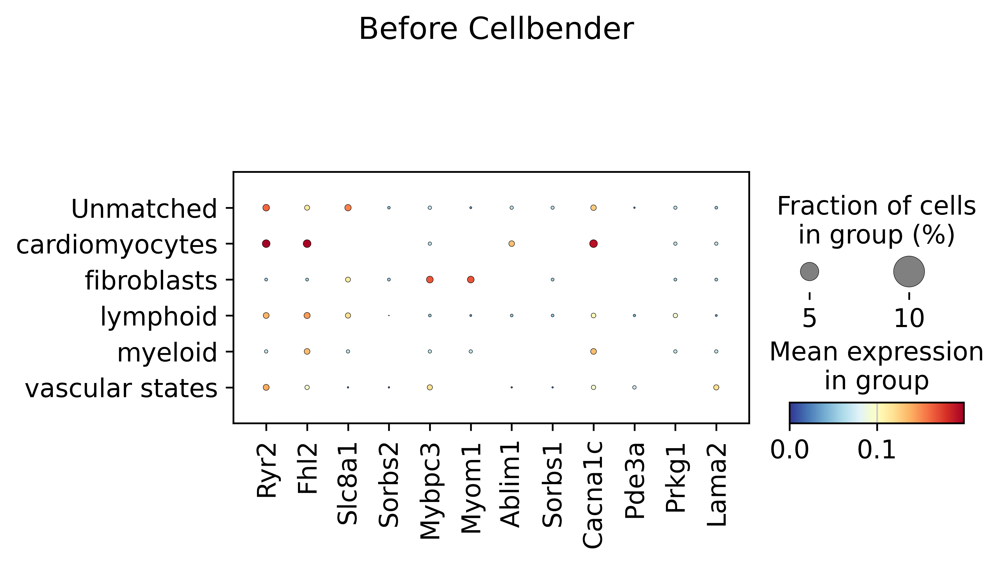

In [46]:
sc.pl.dotplot(bbknn_raw_before_cb_raw, var_names= ['Ryr2','Fhl2', 'Slc8a1', 'Sorbs2',  'Mybpc3', 'Myom1', 'Ablim1', 'Sorbs1', 'Cacna1c', 'Pde3a', 'Prkg1', 'Lama2'], groupby= 'cell_type-broad', cmap= 'RdYlBu_r', title= ' Before Cellbender')

/tmp/ipykernel_77291/2803448850.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expression_per_cell_type = gene_expression_df.groupby('cell_type-broad').mean().reset_index()


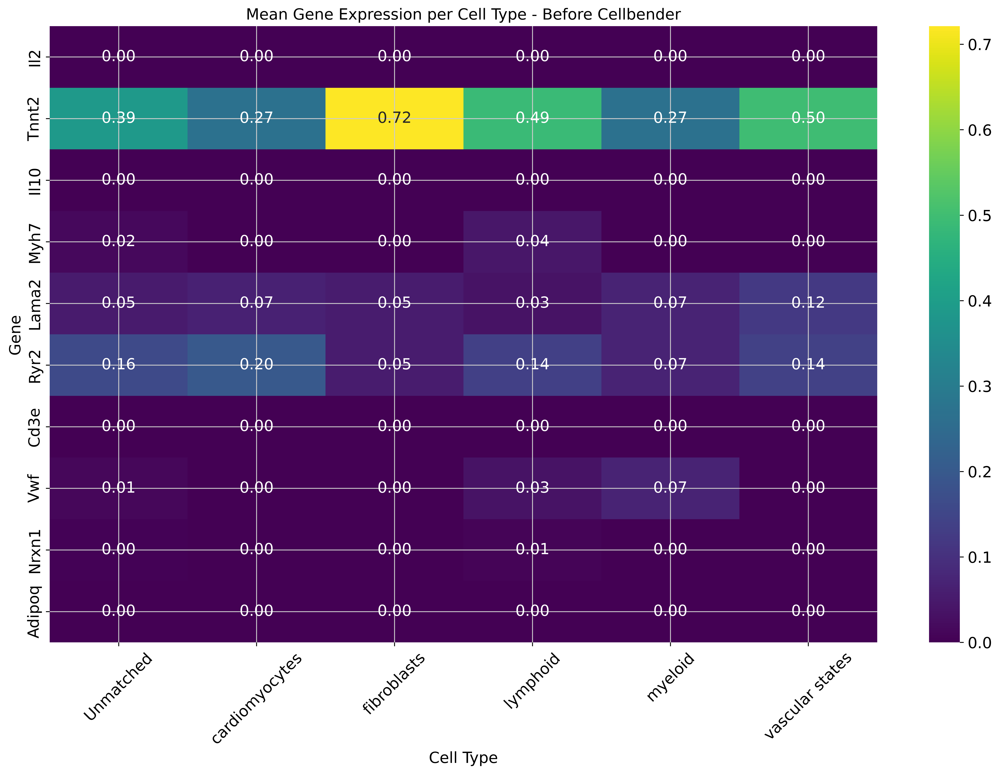

In [42]:
gene_expression_data = bbknn_raw_before_cb_raw[:, present_genes].X
if hasattr(gene_expression_data, 'toarray'):
    gene_expression_data = gene_expression_data.toarray()

gene_expression_df = pd.DataFrame(gene_expression_data, columns=present_genes)
gene_expression_df['cell_type-broad'] = bbknn_raw_before_cb_raw.obs['cell_type-broad'].values

mean_expression_per_cell_type = gene_expression_df.groupby('cell_type-broad').mean().reset_index()

mean_expression_long = mean_expression_per_cell_type.melt(id_vars='cell_type-broad', var_name='Gene', value_name='Mean Expression')

plt.figure(figsize=(14, 10))
sns.heatmap(mean_expression_per_cell_type.set_index('cell_type-broad').T, cmap='viridis', annot=True, fmt='.2f', linecolor= None, linewidths= 0)
plt.title('Mean Gene Expression per Cell Type - Before Cellbender')
plt.xlabel('Cell Type')
plt.ylabel('Gene')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [43]:
bbknn_raw_before_cb_raw.write_h5ad(f'../../raw_data/raw_anndatas/dmd_merged_raw_before_cb_annotated_{timestamp}.h5ad')

/tmp/ipykernel_77291/1085482103.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_20.values, y=top_20.index, palette='viridis')


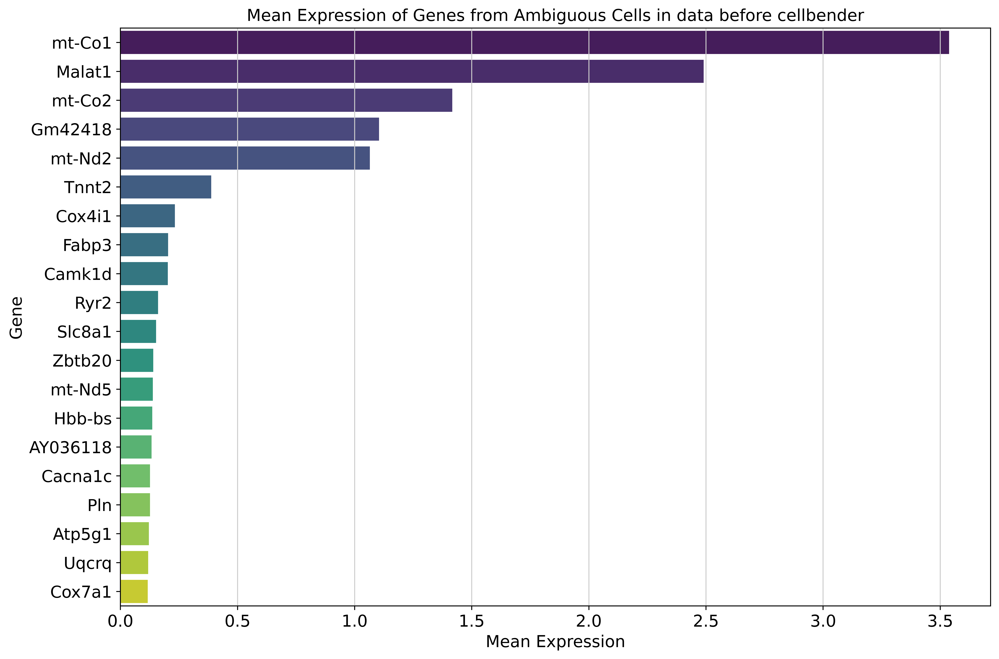

In [44]:
ambiguous_genes_path = '../../raw_data/raw_anndatas/ambiguous_genes.txt'
with open(ambiguous_genes_path, 'r') as file:
    ambiguous_genes = [line.strip() for line in file]

present_genes = [gene for gene in ambiguous_genes if gene in before_cb_raw.var_names]

expression_data = before_cb_raw[:, present_genes].X
if hasattr(expression_data, 'toarray'):
    expression_data = expression_data.toarray()

expression_df = pd.DataFrame(expression_data, columns=present_genes)

mean_expression = expression_df.mean(axis=0).sort_values(ascending=False)
top_20 = mean_expression.head(20)

plt.figure(figsize=(12, 8))
sns.barplot(x=top_20.values, y=top_20.index, palette='viridis')
plt.xlabel('Mean Expression')
plt.ylabel('Gene')
plt.title('Mean Expression of Genes from Ambiguous Cells in data before cellbender')
plt.tight_layout()
plt.show()